<a href="https://colab.research.google.com/github/benhaynor/prism-colab/blob/main/Public_Prism_Colab.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Install Libraries

Note: this will ask for drive permissions. This colab uses Google drive to store style images, and content images.

In [ ]:
!pip install -q git+https://github.com/moritztng/prism.git
from IPython.display import Image
from google.colab import drive
from IPython.display import display
from PIL import Image
from style_transfer.learn import StyleTransfer
import numpy as np
drive.mount('/drive')

Mounted at /drive


Set up style, content selector

style_dir should be a directory on google drive containing style jpgs.

content_dir should be a directory on google drive containing content jpg.

TODO(self): Default values should point to a public google folder so that this simply works by default.

In [ ]:
style_dir = '/drive/MyDrive/UHR/Styles'# @param
content_dir = '/drive/MyDrive/UHR/Content'# @param
import os
import ipywidgets as widgets

style_selector = widgets.Dropdown(
    options=os.listdir(style_dir),
    value=os.listdir(style_dir)[0],
    description='Style',
    disabled=False,
)
display(style_selector)

content_selector = widgets.Dropdown(
    options=os.listdir(content_dir),
    value=os.listdir(content_dir)[0],
    description='Content',
    disabled=False,
)
display(content_selector)


Dropdown(description='Style', options=('81575.jpg', 'asheville.jpg', 'candy.jpg', 'composition.jpg', 'composit…

Dropdown(description='Content', options=('pexels-alisha-lubben-2305747.jpg', 'pexels-andrea-piacquadio-3830880…

## Run Style Transfer

Downloading: "https://storage.googleapis.com/prism-weights/vgg19-original.pth" to /root/.cache/torch/hub/checkpoints/vgg19-original.pth


  0%|          | 0.00/76.4M [00:00<?, ?B/s]

Generating image with output resolution 512


/usr/local/lib/python3.7/dist-packages/style_transfer/utils.py:19: UserWarning: torch.eig is deprecated in favor of torch.linalg.eig and will be removed in a future PyTorch release.
torch.linalg.eig returns complex tensors of dtype cfloat or cdouble rather than real tensors mimicking complex tensors.
L, _ = torch.eig(A)
should be replaced with
L_complex = torch.linalg.eigvals(A)
and
L, V = torch.eig(A, eigenvectors=True)
should be replaced with
L_complex, V_complex = torch.linalg.eig(A) (Triggered internally at  ../aten/src/ATen/native/BatchLinearAlgebra.cpp:2894.)
  eval_content, evec_content = cov_content.eig(True)


Iteration: 50        Time: 0.102          Loss: 2.7e+05        Content Loss: 1.8e+05        Style Loss: 9.4e+01        Mean Abs Grad: 7.7e-02        Grad Zeros: 0    Grad Scale: 6.6e+04
Iteration: 100       Time: 0.0853         Loss: 2.0e+05        Content Loss: 1.5e+05        Style Loss: 4.7e+01        Mean Abs Grad: 4.0e-02        Grad Zeros: 0    Grad Scale: 6.6e+04
Iteration: 150       Time: 0.098          Loss: 1.7e+05        Content Loss: 1.4e+05        Style Loss: 3.4e+01        Mean Abs Grad: 2.2e-02        Grad Zeros: 0    Grad Scale: 6.6e+04
Iteration: 200       Time: 0.099          Loss: 1.6e+05        Content Loss: 1.3e+05        Style Loss: 2.8e+01        Mean Abs Grad: 2.5e-02        Grad Zeros: 1    Grad Scale: 6.6e+04
Iteration: 250       Time: 0.0994         Loss: 1.6e+05        Content Loss: 1.3e+05        Style Loss: 2.6e+01        Mean Abs Grad: 2.2e-02        Grad Zeros: 0    Grad Scale: 6.6e+04
Iteration: 300       Time: 0.0999         Loss: 1.5e+05        Content

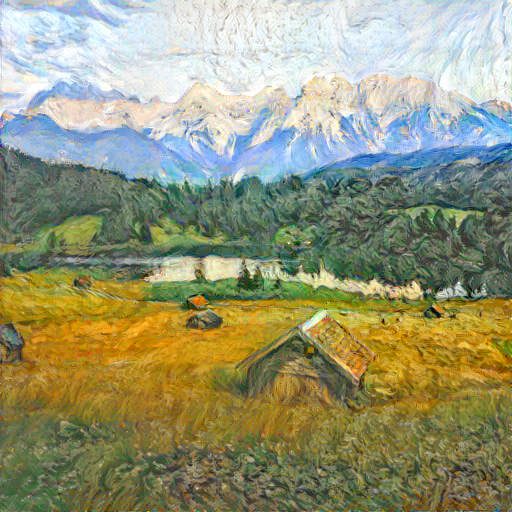

Generating image with output resolution 1024
Iteration: 50        Time: 0.224          Loss: 2.0e+05        Content Loss: 1.8e+05        Style Loss: 2.5e+01        Mean Abs Grad: 1.5e-02        Grad Zeros: 0    Grad Scale: 6.6e+04
Iteration: 100       Time: 0.315          Loss: 1.6e+05        Content Loss: 1.5e+05        Style Loss: 1.6e+01        Mean Abs Grad: 6.1e-03        Grad Zeros: 0    Grad Scale: 6.6e+04
Iteration: 150       Time: 0.361          Loss: 1.5e+05        Content Loss: 1.3e+05        Style Loss: 1.4e+01        Mean Abs Grad: 6.6e-03        Grad Zeros: 0    Grad Scale: 6.6e+04
Iteration: 200       Time: 0.36           Loss: 1.4e+05        Content Loss: 1.3e+05        Style Loss: 1.4e+01        Mean Abs Grad: 3.1e-03        Grad Zeros: 0    Grad Scale: 6.6e+04


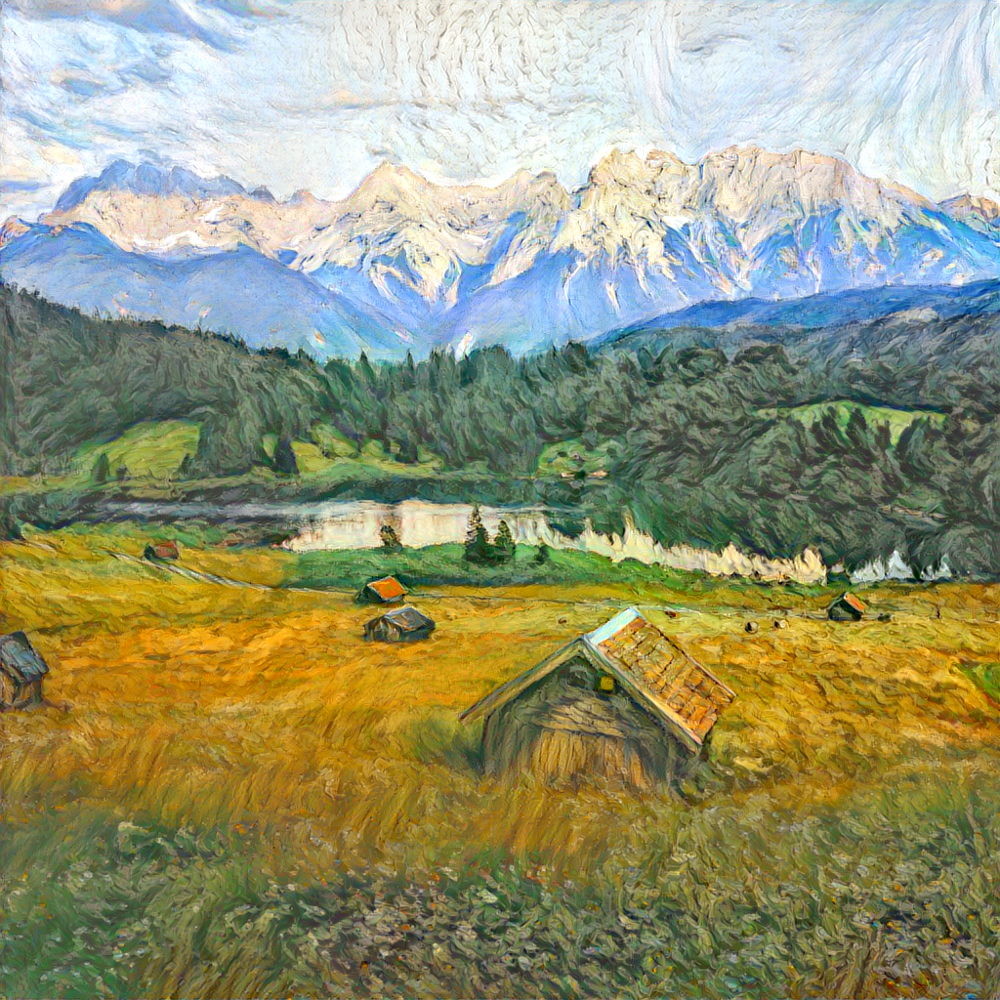

Generating image with output resolution 2048
Iteration: 50        Time: 1.01           Loss: 2.6e+05        Content Loss: 2.3e+05        Style Loss: 3.1e+01        Mean Abs Grad: 5.1e-03        Grad Zeros: 0    Grad Scale: 6.6e+04
Iteration: 100       Time: 1.42           Loss: 2.0e+05        Content Loss: 1.8e+05        Style Loss: 1.5e+01        Mean Abs Grad: 1.8e-03        Grad Zeros: 0    Grad Scale: 6.6e+04
Iteration: 150       Time: 1.64           Loss: 1.8e+05        Content Loss: 1.6e+05        Style Loss: 1.3e+01        Mean Abs Grad: 1.6e-03        Grad Zeros: 0    Grad Scale: 6.6e+04
Iteration: 200       Time: 1.64           Loss: 1.7e+05        Content Loss: 1.6e+05        Style Loss: 1.3e+01        Mean Abs Grad: 8.8e-04        Grad Zeros: 0    Grad Scale: 6.6e+04


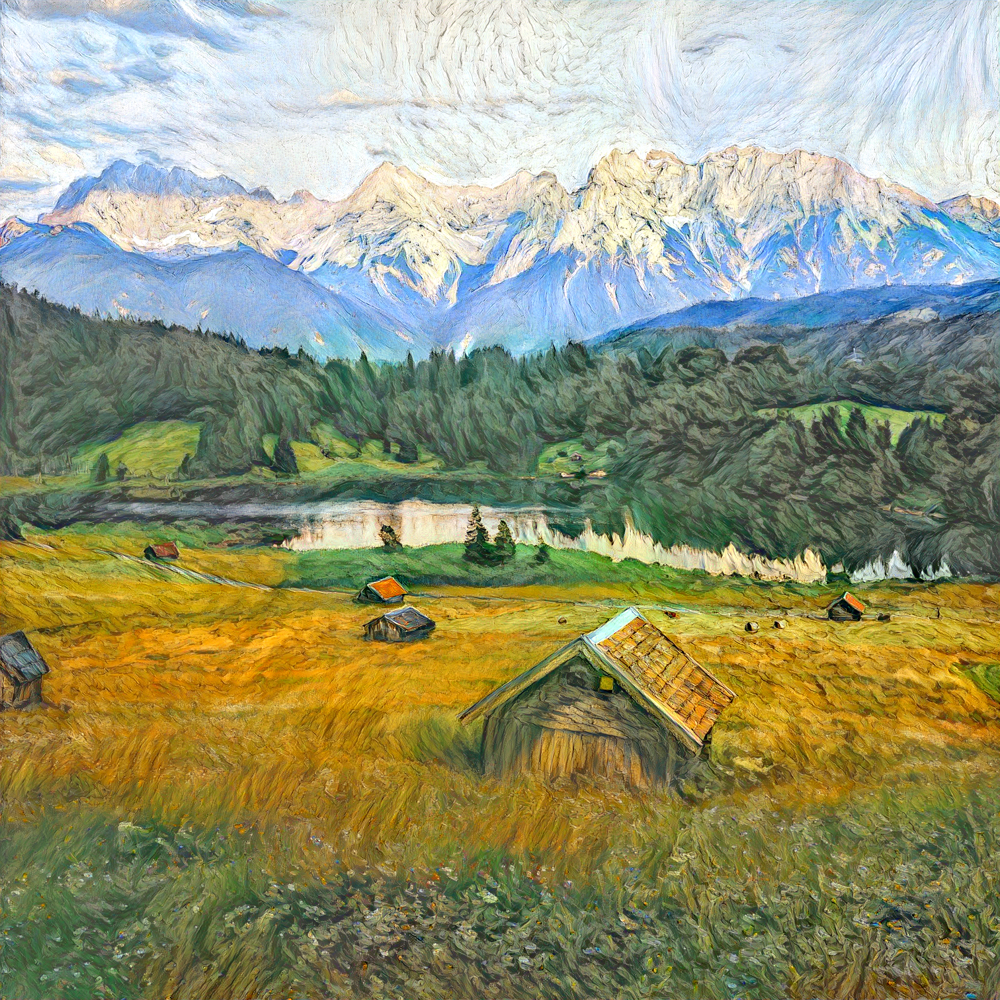

In [ ]:
# @markdown Increase the style weight to get a more stylistic output.
style_weight = 1e3 #@param
# @markdown By default, use 512 x 512 as max dimension. Can go as high as 2048 before running out of GPU memory on the colab pro runtime (with 16G GPU ram). Will take multiple minutes at higher resolutions.
output_resolution =  2048#@param

content = '{}/{}'.format(content_dir, content_selector.value)
style = '{}/{}'.format(style_dir, style_selector.value)

#TODO(self): set up caching by style transfer arguments and input image.
style_transfer = StyleTransfer(lr=1,
                               content_weight=1, 
                               style_weight=style_weight,
                               content_weights="{'relu_4_2':1}", 
                               style_weights="{'relu_1_1':1,'relu_2_1':1,'relu_3_1':1,'relu_4_1':1,'relu_5_1':1}",
                               avg_pool=False, 
                               feature_norm=True, 
                               weights='original',
                               preserve_color='style', 
                               device='auto',
                               use_amp=False,
                               adam=False, 
                               optim_cpu=True, 
                               logging=50)

resolution = min(512, output_resolution)
print('Generating image with output resolution {}'.format(resolution))
artwork = style_transfer(Image.open(content), Image.open(style), 
                  area=resolution, init_random=False, init_img=None, iter=500)
display(artwork)
while (resolution < output_resolution):
  resolution *= 2
  resolution = min(resolution, output_resolution)
  print('Generating image with output resolution {}'.format(resolution))
  artwork = style_transfer(Image.open(content), Image.open(style), 
                    area=resolution, init_random=False, init_img=artwork, iter=200)
  display(artwork)